## Minimal Experiment
In this notebook I attempt to run the first batch of minimal experiments: run multiple market sessions with homogeneous populations of PRDE traders with different k-values and analyse if it results in any differneces in average profit.

Helper functions from lab 8

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import csv
import math
import random

import scipy as sp
from scipy import stats
import seaborn as sns 
import matplotlib.pyplot as plt 
import statsmodels.api as sm
import pandas as pd

from BSE import market_session

# The next are helper functions that you will use later, if they don't make 
# much sense now, don't worry too much about it they will become clearer later:

# Use this to plot trades of a single experiment
def plot_trades(trial_id):
    prices_fname = trial_id + '_tape.csv'
    x = np.empty(0)
    y = np.empty(0)
    with open(prices_fname, newline='') as csvfile:
        reader = csv.reader(csvfile)
        for row in reader:
            time = float(row[1])
            price = float(row[2])
            x = np.append(x,time)
            y = np.append(y,price)

    plt.plot(x, y, 'x', color='black') 
    
# Use this to run an experiment n times and plot all trades
def n_runs_plot_trades(n, trial_id, start_time, end_time, traders_spec, order_sched):
    x = np.empty(0)
    y = np.empty(0)

    for i in range(n):
        trialId = trial_id + '_' + str(i)
        tdump = open(trialId + '_avg_balance.csv','w')

        market_session(trialId, start_time, end_time, traders_spec, order_sched, tdump, True, False)
        
        tdump.close()

        with open(trialId + '_tape.csv', newline='') as csvfile:
            reader = csv.reader(csvfile)
            for row in reader:
                time = float(row[1])
                price = float(row[2])
                x = np.append(x,time)
                y = np.append(y,price)

    plt.plot(x, y, 'x', color='black');

# !!! Don't use on it's own   
def getorderprice(i, sched, n, mode):
    pmin = min(sched[0][0], sched[0][1])
    pmax = max(sched[0][0], sched[0][1])
    prange = pmax - pmin
    stepsize = prange / (n - 1)
    halfstep = round(stepsize / 2.0)

    if mode == 'fixed':
        orderprice = pmin + int(i * stepsize)
    elif mode == 'jittered':
        orderprice = pmin + int(i * stepsize) + random.randint(-halfstep, halfstep)
    elif mode == 'random':
        if len(sched) > 1:
            # more than one schedule: choose one equiprobably
            s = random.randint(0, len(sched) - 1)
            pmin = min(sched[s][0], sched[s][1])
            pmax = max(sched[s][0], sched[s][1])
        orderprice = random.randint(pmin, pmax)
    return orderprice    

# !!! Don't use on it's own
def make_supply_demand_plot(bids, asks):
    # total volume up to current order
    volS = 0
    volB = 0

    fig, ax = plt.subplots()
    plt.ylabel('Price')
    plt.xlabel('Quantity')
    
    pr = 0
    for b in bids:
        if pr != 0:
            # vertical line
            ax.plot([volB,volB], [pr,b], 'r-')
        # horizontal lines
        line, = ax.plot([volB,volB+1], [b,b], 'r-')
        volB += 1
        pr = b
    if bids:
        line.set_label('Demand')
        
    pr = 0
    for s in asks:
        if pr != 0:
            # vertical line
            ax.plot([volS,volS], [pr,s], 'b-')
        # horizontal lines
        line, = ax.plot([volS,volS+1], [s,s], 'b-')
        volS += 1
        pr = s
    if asks:
        line.set_label('Supply')
        
    if bids or asks:
        plt.legend()
    plt.show()

# Use this to plot supply and demand curves from supply and demand ranges and stepmode
def plot_sup_dem(seller_num, sup_ranges, buyer_num, dem_ranges, stepmode):
    asks = []
    for s in range(seller_num):
        asks.append(getorderprice(s, sup_ranges, seller_num, stepmode))
    asks.sort()
    bids = []
    for b in range(buyer_num):
        bids.append(getorderprice(b, dem_ranges, buyer_num, stepmode))
    bids.sort()
    bids.reverse()
    
    make_supply_demand_plot(bids, asks) 

# plot sorted trades, useful is some situations - won't be used in this worksheet
def in_order_plot(trial_id):
    prices_fname = trial_id + '_tape.csv'
    y = np.empty(0)
    with open(prices_fname, newline='') as csvfile:
        reader = csv.reader(csvfile)
        for row in reader:
            price = float(row[2])
            y = np.append(y,price)
    y = np.sort(y)
    x = list(range(len(y)))

    plt.plot(x, y, 'x', color='black')   

# plot offset function
def plot_offset_fn(offset_fn, total_time_seconds):   
    x = list(range(total_time_seconds))
    offsets = []
    for i in range(total_time_seconds):
        offsets.append(offset_fn(i))
    plt.plot(x, offsets, 'x', color='black')  

Setup of a ststic, homogeneous session with 20 PRDE buyers and sellers and a k to be set

In [2]:
def static_homogeneous_session(k, F, trial_id_str, csv_str):
    # First, configure the trader specifications
    #I have no clue if F is actually being set
    sellers_spec = [('PRDE', 20, {'k': k, 's_min': -1.0, 's_max': +1.0, 'diffevol["F"]':F})]
    buyers_spec = sellers_spec
    traders_spec = {'sellers':sellers_spec, 'buyers':buyers_spec}

    # Next, confiure the supply and demand (and plot it)
    sup_range = (100, 200)
    dem_range = sup_range

    # Next, configure order schedules

    start_time = 0
    end_time = 60 * 3
    supply_schedule = [{'from': start_time, 'to': end_time, 'ranges': [sup_range], 'stepmode': 'fixed'}]
    demand_schedule = [{'from': start_time, 'to': end_time, 'ranges': [dem_range], 'stepmode': 'fixed'}]

    order_interval = 10
    order_sched = {'sup': supply_schedule, 'dem': demand_schedule,
               'interval': order_interval, 'timemode': 'drip-jitter'}

    trial_id = trial_id_str
    tdump = open(csv_str,'w')
    dump_all = True
    verbose = False

    # Now, run the market session
    market_session(trial_id, start_time, end_time, traders_spec, order_sched, tdump, dump_all, verbose)

    tdump.close()

A function that runs n-4 market sessions, each with a different k, produces a plot of the average profits and returns the k that yielded the highest average profits.

In [3]:
def avg_profit(n, trial_id_str, csv_str, out_csv_str):
    i = 4
    profits = []
    while i < n:
        static_homogeneous_session(i, 0.8, trial_id_str, csv_str)
        df = pd.read_csv(csv_str)
        profits.append(df.iloc[:,5].mean())
        i = i+1

    print(profits)
    profits_df = pd.DataFrame([[i] for i in profits])
    profits_df.to_csv(out_csv_str)
    plt.plot(np.arange(4, n, 1), profits)
    return np.argmax(np.array(profits))+4

Run the function j times to see how consistent the results are

B00: PRDE active_strat=[0]:
[0]: s=-0.204417, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.956740, start=0.000000, $=0.000000, pps=0.000000
[2]: s=+0.936916, start=0.000000, $=0.000000, pps=0.000000
[3]: s=+0.585858, start=0.000000, $=0.000000, pps=0.000000


B01: PRDE active_strat=[0]:
[0]: s=-0.470892, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.603425, start=0.000000, $=0.000000, pps=0.000000
[2]: s=+0.909452, start=0.000000, $=0.000000, pps=0.000000
[3]: s=+0.258712, start=0.000000, $=0.000000, pps=0.000000


B02: PRDE active_strat=[0]:
[0]: s=-0.397125, start=0.000000, $=0.000000, pps=0.000000
[1]: s=-0.687964, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.366603, start=0.000000, $=0.000000, pps=0.000000
[3]: s=-0.321743, start=0.000000, $=0.000000, pps=0.000000


B03: PRDE active_strat=[0]:
[0]: s=-0.166783, start=0.000000, $=0.000000, pps=0.000000
[1]: s=+0.080716, start=0.000000, $=0.000000, pps=0.000000
[2]: s=-0.442420, start=0.000000, $=0.000000, pps=0.0000

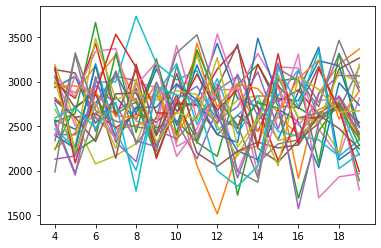

In [4]:
j = 0
best_ks = []
while j < 30:
    best_ks.append(avg_profit(20, 'test_4', 'test_4_avg_balance.csv', 'profit_2.csv'))
    j = j+1

print(best_ks)

They vary quite a bit, there doesn't seem to be a trend. the market sessions have some degree of randomness in them, FIGURE OUT WHERE IT COMES FROM. It may also be that 
+ the measure of average profit is not appropriate as I'm not extracting the limit prices I believe, or 
+ I haven't ran enough repetitions to extract any meaningful insights
+ I haven't investigated it hard enough 

median: 11.0
mean: 11.533333333333333


(array([7., 2., 1., 6., 3., 1., 4., 1., 2., 3.]),
 array([ 6. ,  7.3,  8.6,  9.9, 11.2, 12.5, 13.8, 15.1, 16.4, 17.7, 19. ]),
 <BarContainer object of 10 artists>)

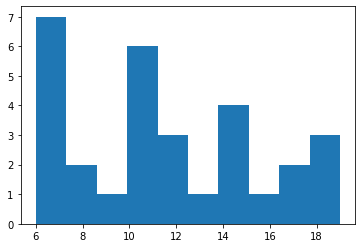

In [14]:
print('median: ' + str(np.median(np.array(best_ks))))
print('mean: ' + str(np.mean(np.array(best_ks))))
plt.hist(np.array(best_ks))